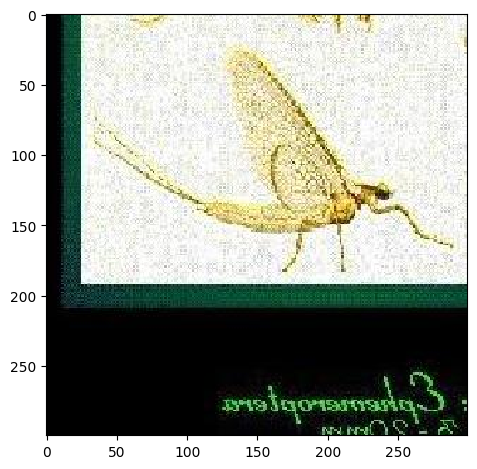

In [1]:
from skimage.feature import daisy
from skimage import io, util
import numpy as np
import matplotlib.pyplot as plt


i = 1
I = io.imread('images/%03d.jpg'%i)
I = util.img_as_float(I)
io.imshow(I)

# Q1

In [2]:
mat_all = np.empty((0, 200))

for i in range(300):
    I = io.imread('images/%03d.jpg'%i, as_gray=True)
    I = util.img_as_float(I)
    descs = daisy(I, step=12, radius=20, rings=3, histograms=8, orientations=8)
    p, q, r = descs.shape
    descs_2d = descs.reshape(p*q, r)

    mat_all = np.vstack((mat_all, descs_2d))

print(mat_all.shape)

(114707, 200)


# Q2

In [3]:
from sklearn.cluster import KMeans

diff_words = 20

kmeans = KMeans(n_clusters=diff_words)
kmeans.fit(mat_all)


KMeans(n_clusters=20)

# Q3 & Q4

In [4]:
def hist_img(img, normalize=False):
    descs = daisy(I, step=12, radius=20, rings=3, histograms=8, orientations=8)
    p, q, r = descs.shape
    descs_2d = descs.reshape(p*q, r)

    hist = np.zeros(diff_words)
    for i in range(p*q):
        word = kmeans.predict([descs_2d[i, :]])
        hist[word] += 1

    if normalize:
        hist /= np.sum(hist)

    return hist

In [5]:
all_hists = np.empty((0, diff_words))

for i in range(300):
    I = io.imread('images/%03d.jpg'%i, as_gray=True)
    I = util.img_as_float(I)
    hist = hist_img(I)

    all_hists = np.vstack((all_hists, hist))

    # plt.bar(range(diff_words), hist)
    # plt.show()




# Q5

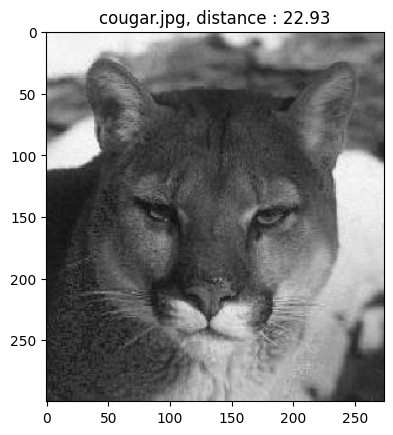

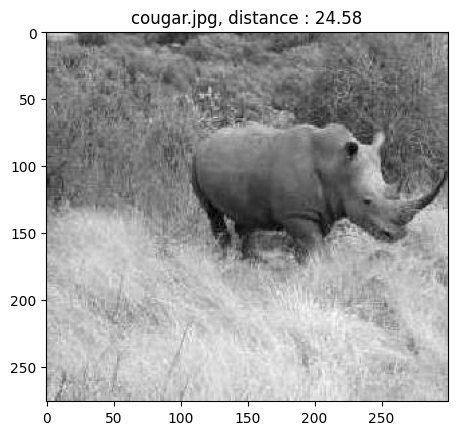

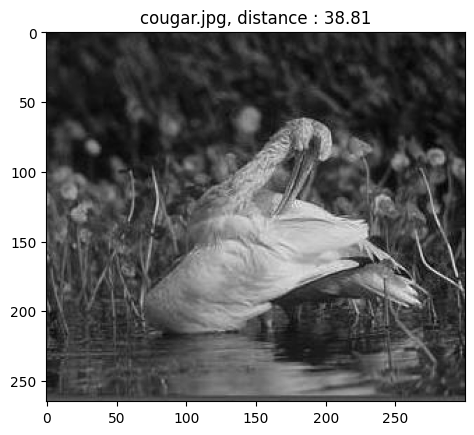

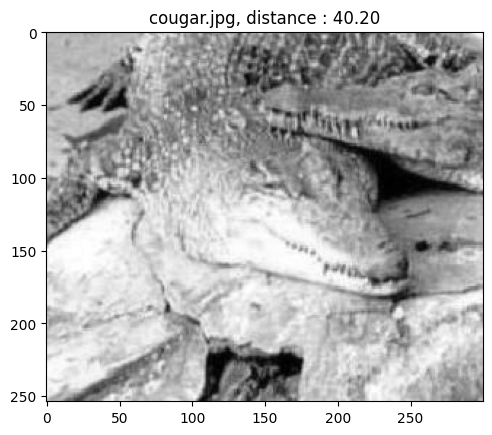

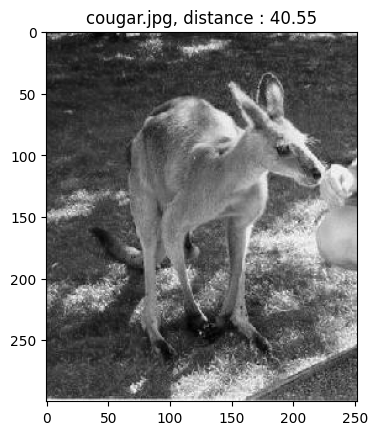

...

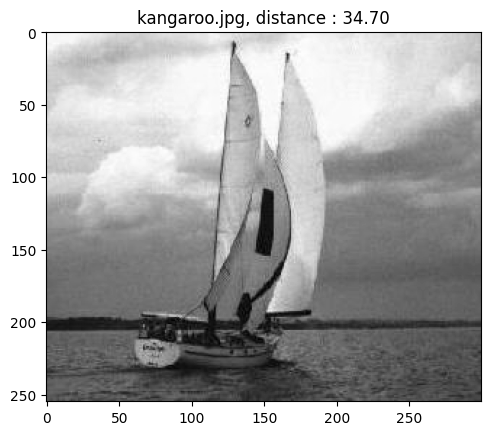

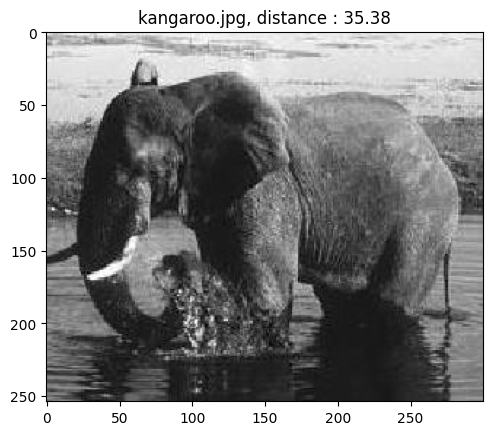

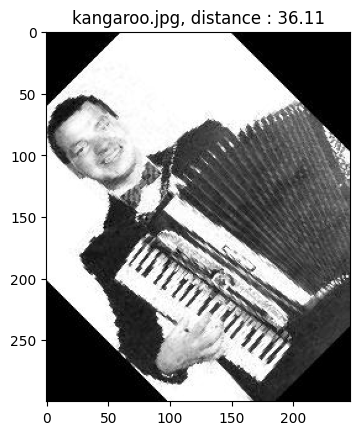

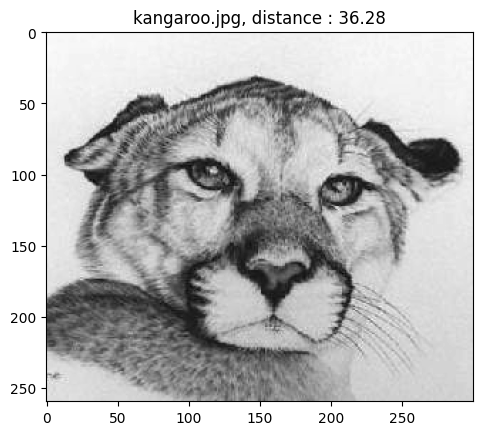

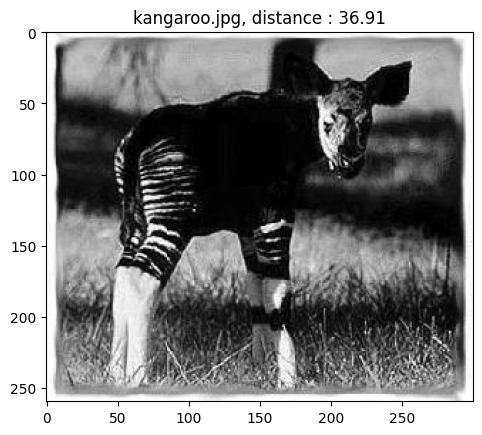

In [6]:
for test_img in ['cougar.jpg', 'crab.jpg', 'kangaroo.jpg']:
    I = io.imread(f'test/{test_img}', as_gray=True)
    I = util.img_as_float(I)

    mins = np.linalg.norm(all_hists - hist_img(I), axis=1).argsort()[:10]

    for i in mins:
        plt.imshow(io.imread('images/%03d.jpg'%i, as_gray=True), cmap='gray')
        plt.title(f'{test_img}, distance : {np.linalg.norm(all_hists[i] - hist_img(I)):.2f}')
        plt.show()

# Q6

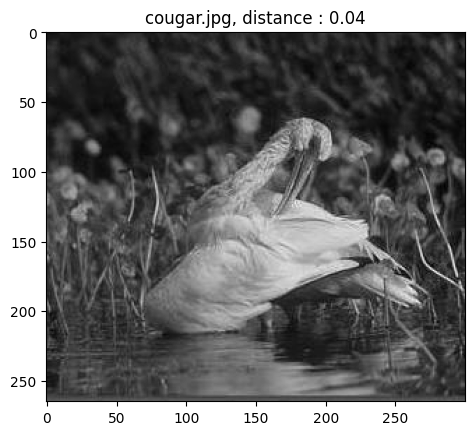

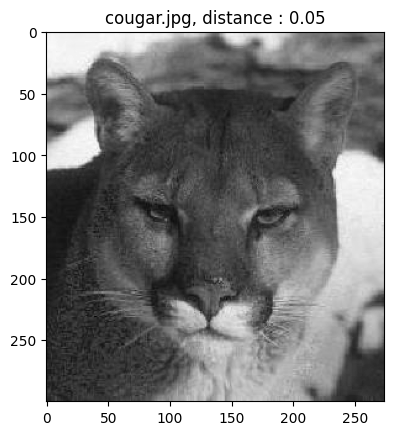

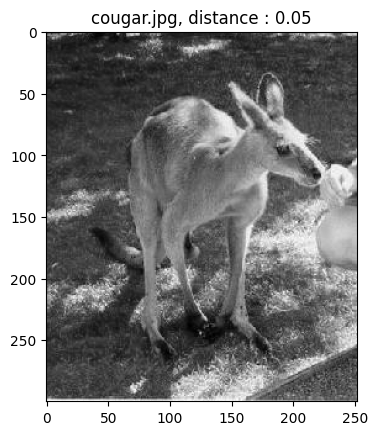

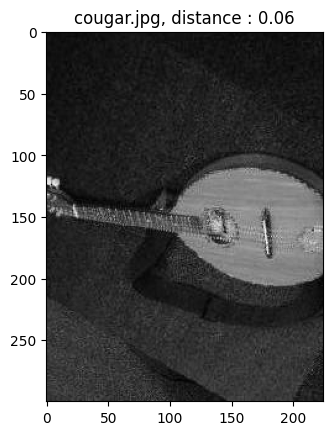

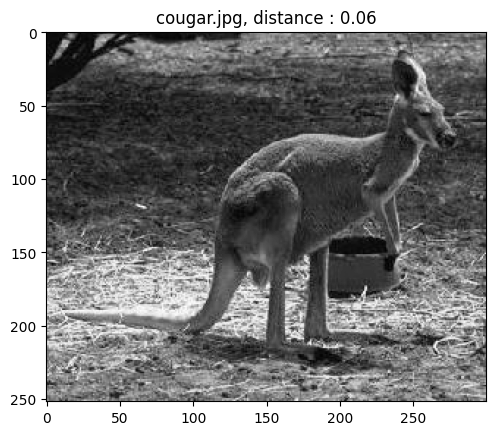

...

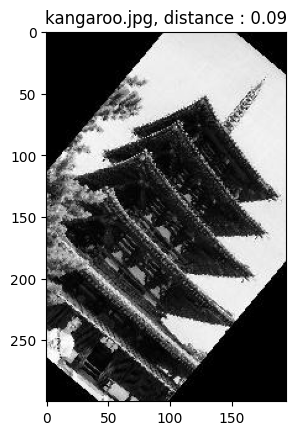

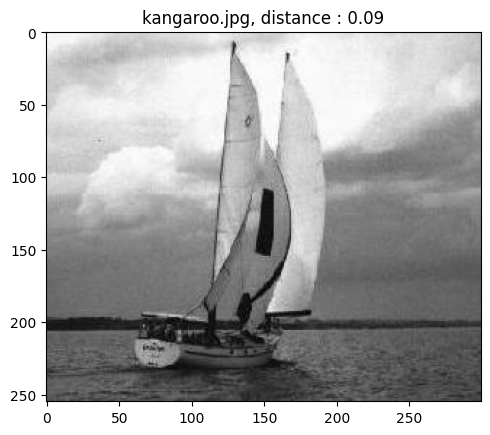

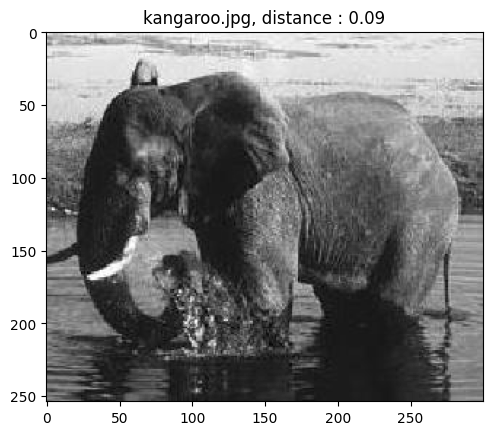

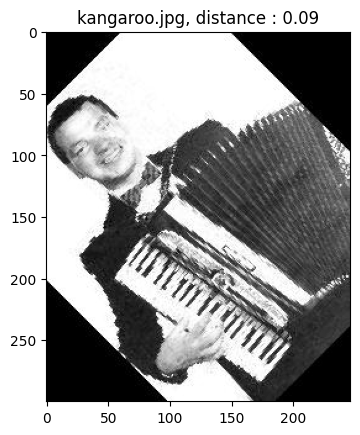

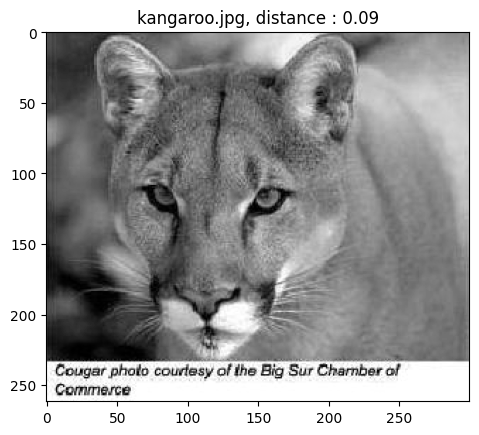

In [7]:
all_hists_norm = np.empty((0, diff_words))

for i in range(300):
    I = io.imread('images/%03d.jpg'%i, as_gray=True)
    I = util.img_as_float(I)
    hist = hist_img(I, normalize=True)

    all_hists_norm = np.vstack((all_hists_norm, hist))

for test_img in ['cougar.jpg', 'crab.jpg', 'kangaroo.jpg']:
    I = io.imread(f'test/{test_img}', as_gray=True)
    I = util.img_as_float(I)

    mins = np.linalg.norm(all_hists_norm - hist_img(I, normalize=True), axis=1).argsort()[:10]

    for i in mins:
        plt.imshow(io.imread('images/%03d.jpg'%i, as_gray=True), cmap='gray')
        plt.title(f'{test_img}, distance : {np.linalg.norm(all_hists_norm[i] - hist_img(I, normalize=True)):.2f}')
        plt.show()

# Q7
Relancer le code avec différents paramètres

# Q8

In [8]:
from skimage.feature import SIFT

sift = SIFT()

I = io.imread('images/000.jpg', as_gray=True)

sift.detect_and_extract(I)

print(sift.descriptors.shape)

(189, 128)
